In [ ]:
!pip install wordcloud #Librería para importar nube de palabras


In [ ]:
import pandas as pd #manipulación de datos
import re #libreria de análisis de contenido textual

from wordcloud import WordCloud #libreria nube de palabras
import matplotlib.pyplot as plt #libreria para graficar

import nltk #libreria para trabajar NLP
nltk.download('stopwords')
from nltk.corpus import stopwords

import networkx as nx #librería para manipular gráficos

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
df = pd.read_csv('C:/Users/KEVIN/Downloads/emociones_texto (1).csv')

In [6]:
#crear dataframes por cada emoción
sad_df = df[df['max_emotion'] == 'Sad']
angry_df = df[df['max_emotion'] == 'Angry']
care_df = df[df['max_emotion'] == 'Care']
love_df = df[df['max_emotion'] == 'Love']
wow_df = df[df['max_emotion'] == 'Wow']
haha_df = df[df['max_emotion'] == 'Haha']

In [7]:
def clean_text(text):
  # Remover emojis
  emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # símbolos & pictogramas
                           u"\U0001F680-\U0001F6FF"  # mapas de símbolos
                           u"\U0001F1E0-\U0001F1FF"  # banderas (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
  text = emoji_pattern.sub(r'', str(text)) # convertir texto en string

  # Remover no caracteres válidos
  text = re.sub(r'[^a-zA-Z0-9\s.,!?;:\'\"-]', '', text)
  return text

# aplicar a los 6 dataframes que se crearon

dataframes = [sad_df, angry_df, care_df, love_df, wow_df, haha_df]

for df in dataframes:
  df['message'] = df['message'].apply(clean_text)

In [8]:
#Limpieza de stopwords
spanish_stopwords = stopwords.words('spanish')
custom_stopwords = spanish_stopwords + ['dio', 'http', 'https', 'www', 'WWW', 'youtube', 'Youtube']

def remove_stopwords(text):
  words = text.split()
  filtered_words = [word for word in words if word.lower() not in custom_stopwords]
  return ' '.join(filtered_words)

for df in dataframes:
  df['message'] = df['message'].apply(remove_stopwords)

In [9]:
#Transformación a  cadenas de texto

all_sad_messages = " ".join(sad_df['message'].dropna())
all_angry_messages = " ".join(angry_df['message'].dropna())
all_care_messages = " ".join(care_df['message'].dropna())
all_love_messages = " ".join(love_df['message'].dropna())
all_wow_messages = " ".join(wow_df['message'].dropna())
all_haha_messages = " ".join(haha_df['message'].dropna())

In [10]:

# Generación de nubes de palabras por cada emoción 
sad_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_sad_messages)

angry_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_angry_messages)

care_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_care_messages)

love_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_love_messages)

wow_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_wow_messages)

haha_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_haha_messages)
# Generate wordclouds for each emotion
sad_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_sad_messages)

angry_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_angry_messages)

care_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_care_messages)

love_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_love_messages)

wow_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_wow_messages)

haha_wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = custom_stopwords,
                min_font_size = 10).generate(all_haha_messages)

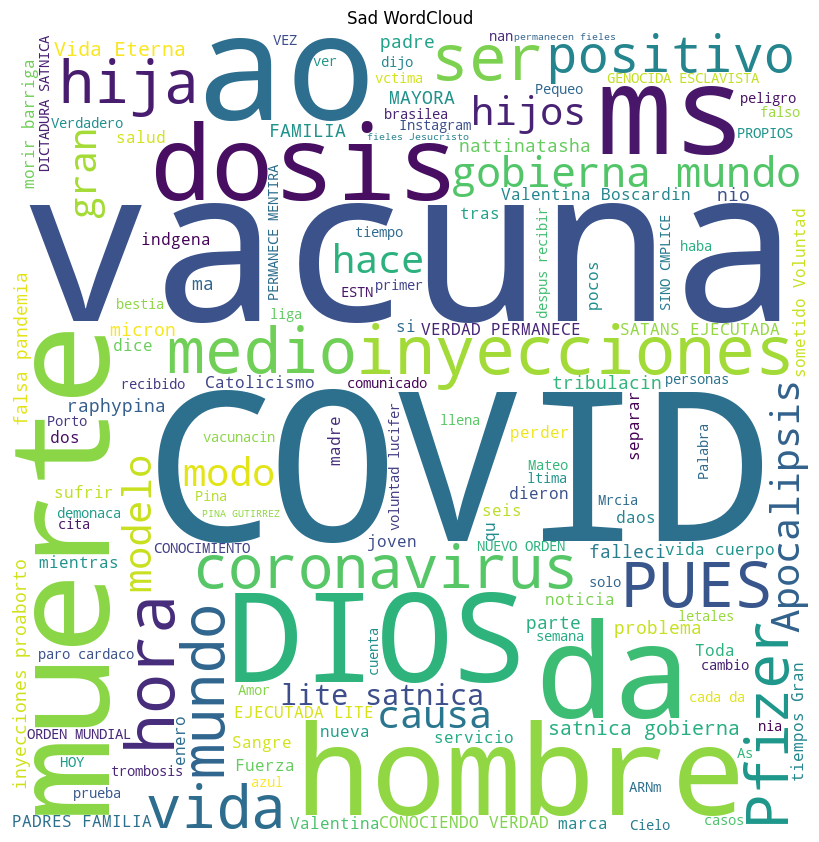

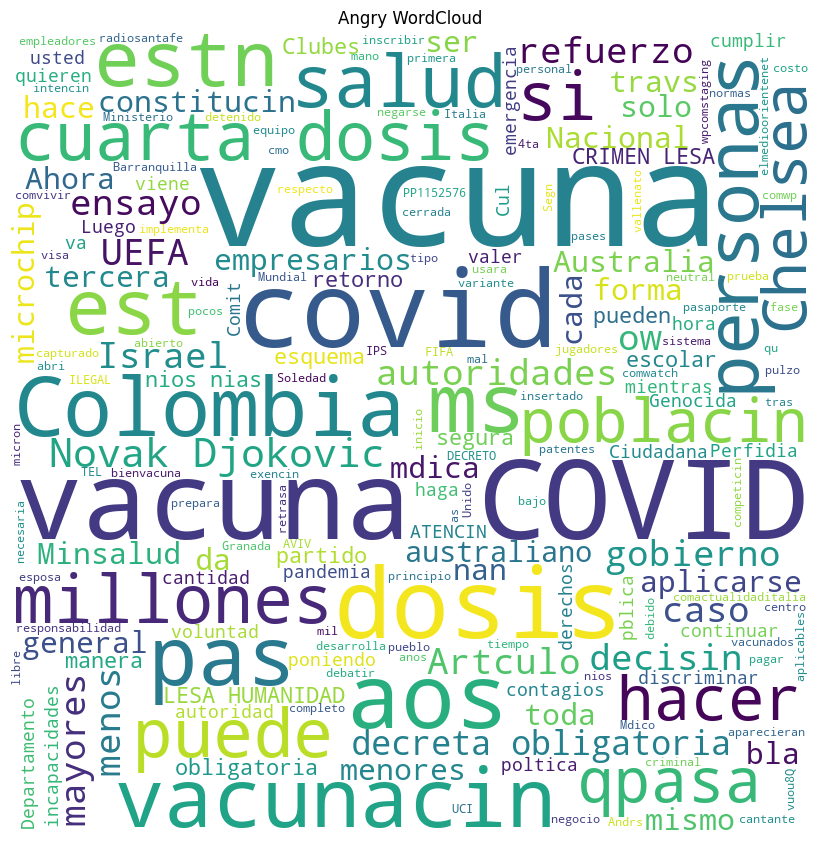

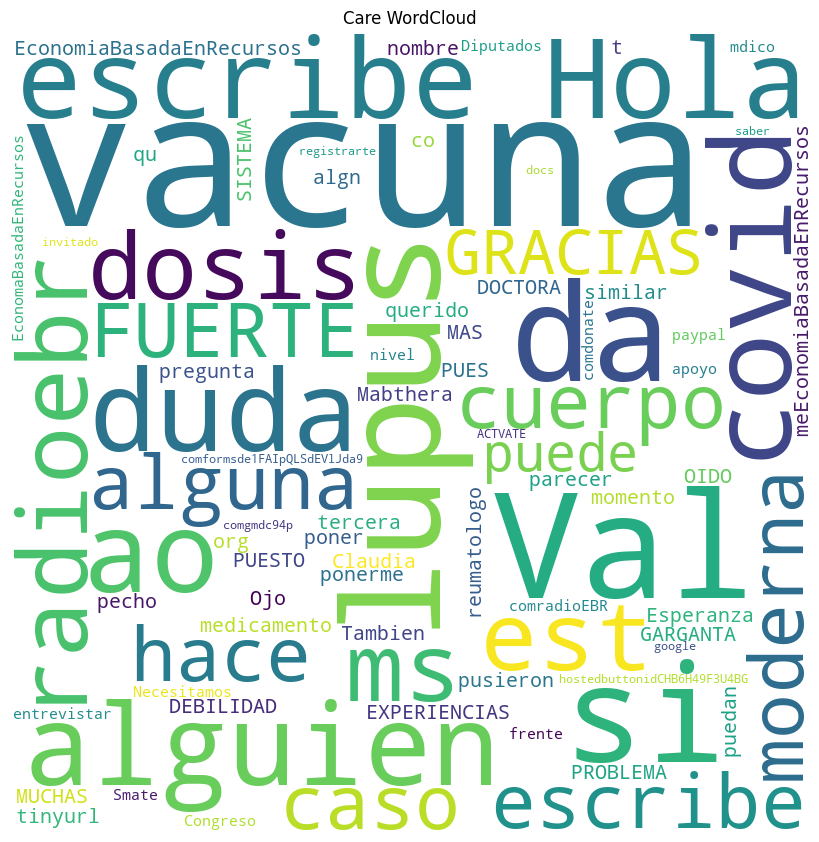

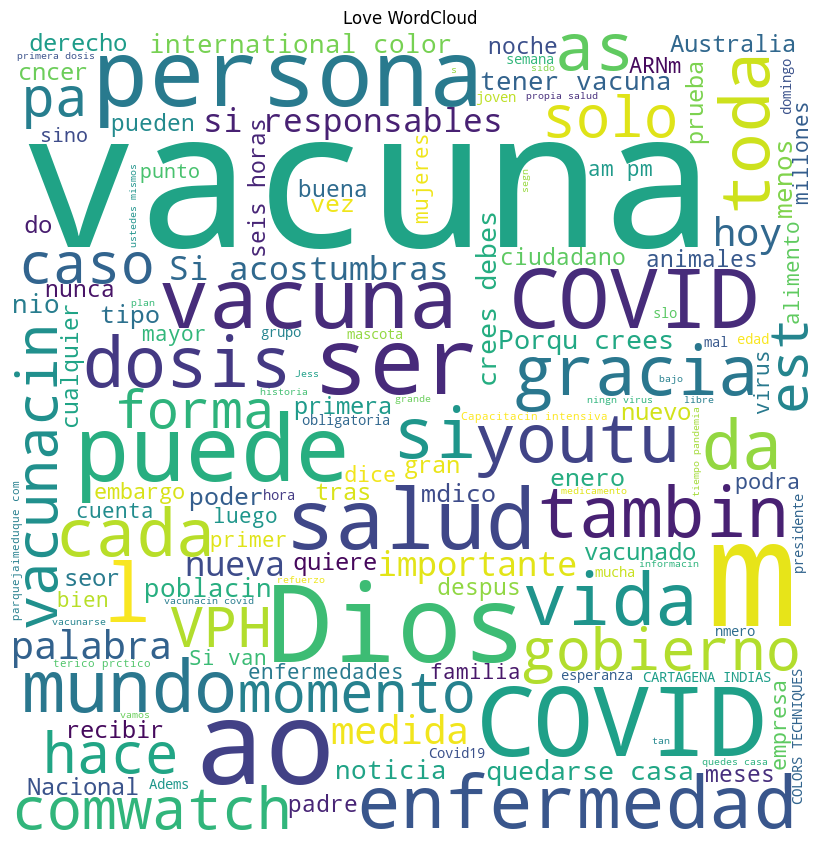

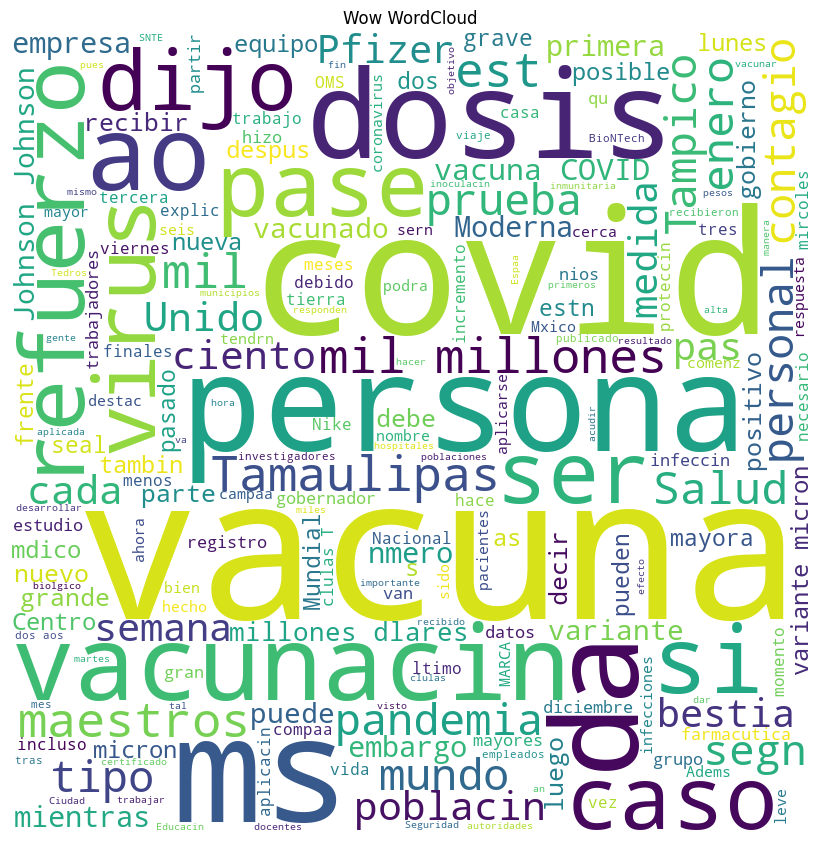

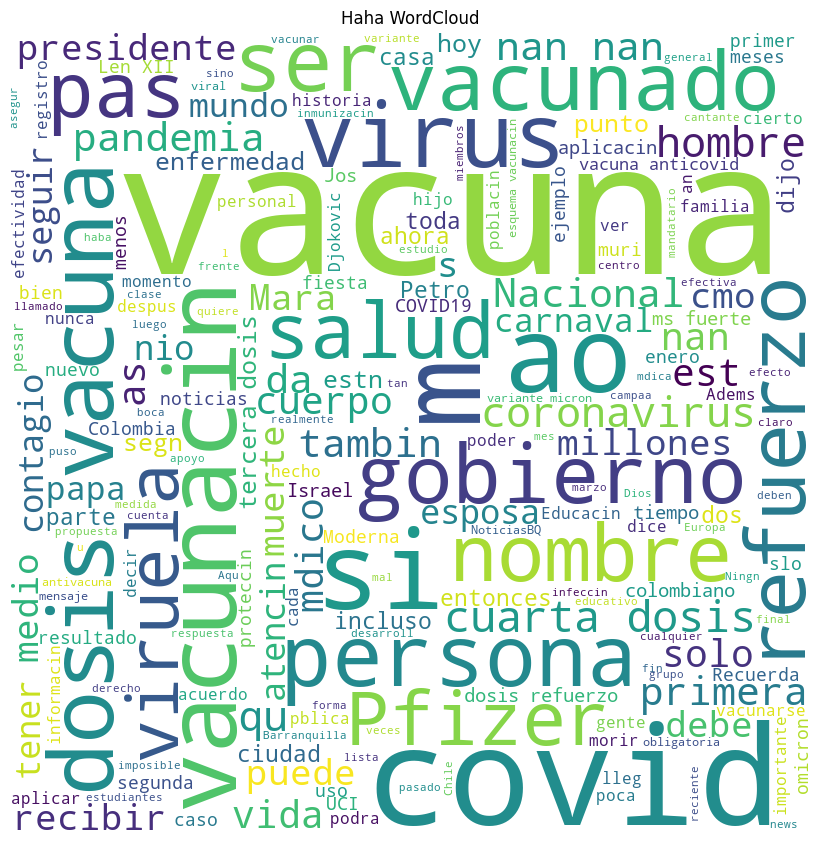

In [11]:
#Imprimir nubes de palabras

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(sad_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Sad WordCloud")
plt.show()

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(angry_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Angry WordCloud")
plt.show()

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(care_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Care WordCloud")
plt.show()

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(love_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Love WordCloud")
plt.show()

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wow_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Wow WordCloud")
plt.show()

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(haha_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Haha WordCloud")
plt.show()

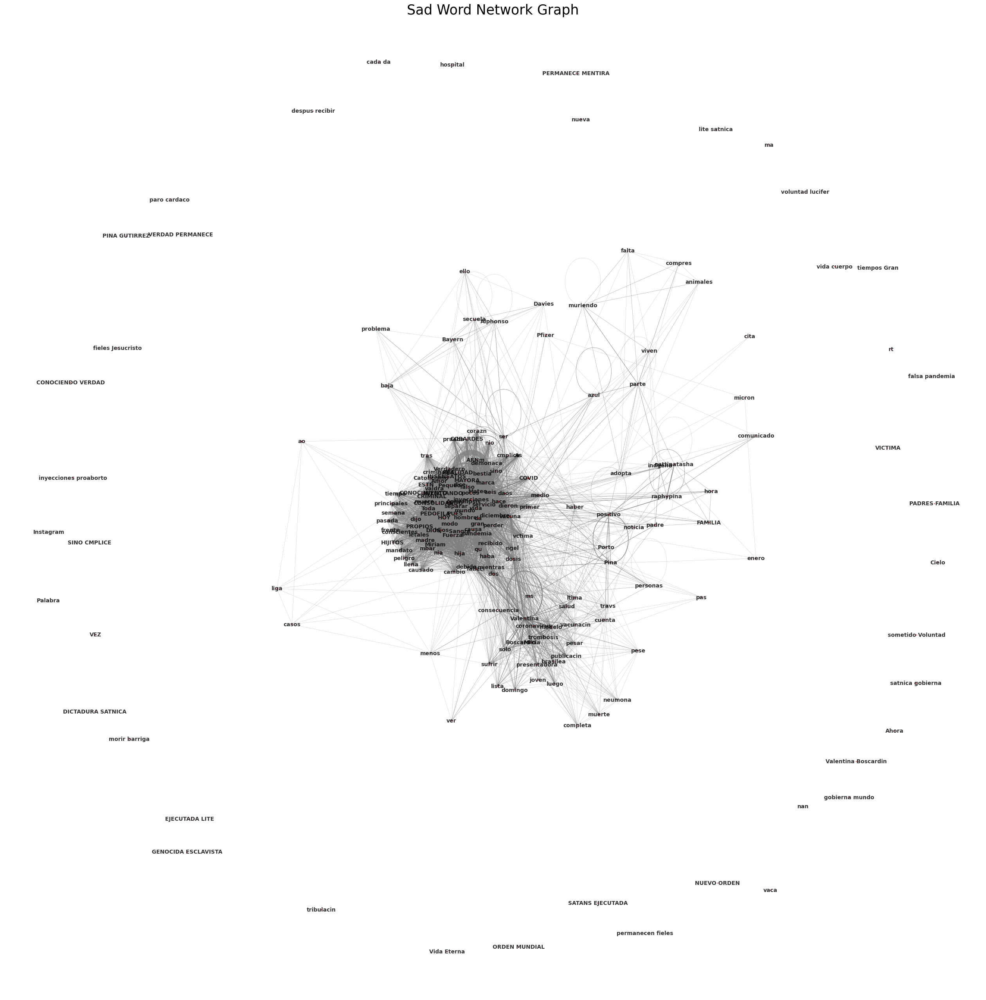

In [12]:
 #Gráfico de tristeza##

 #Agrupar las palabras más comunes de acuerdo a la nube de palabras
sad_word_frequencies = sad_wordcloud.words_

# Crear un gráfico
G1 = nx.Graph()

# Agregas nodos basados en la frecuencia
for word, freq in sad_word_frequencies.items():
    G1.add_node(word, size=freq)

# Iterar a través de cada mensaje para encontrar relaciones entre palabras.

for message in sad_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre las palabras que aparecen en el mismo mensaje.


    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in sad_word_frequencies and word2 in sad_word_frequencies:
                 if G1.has_edge(word1, word2):
                     G1[word1][word2]['weight'] += 1
                 else:
                     G1.add_edge(word1, word2, weight=1)


# "Obtener los tamaños de los nodos a partir del atributo 'size'."

node_size = [G1.nodes[node]['size'] * 5 for node in G1.nodes()] #Escalar el tamaño de los nodos para una mejor visualización

# Obtener los pesos de las aristas para la visualización 
edge_weights = [G1[u][v]['weight'] for u, v in G1.edges()]

# Dibujar el grafo.
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G1, k=0.5, iterations=50) # Usar un diseño por resortes para una mejor visualización
nx.draw(G1, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey', # Usa un color menos dominante para los bordes.
        width=[w/5 for w in edge_weights], #Reduce el grosor de los borde
        alpha=0.8, # Incrementar nodo Alfa
        font_size=10, # Ajustar tamalo frontal
        font_weight='bold' # hacer etiquetas
       )
plt.title("Sad Word Network Graph", fontsize=25) # Incrementar tamaño de título
plt.show()

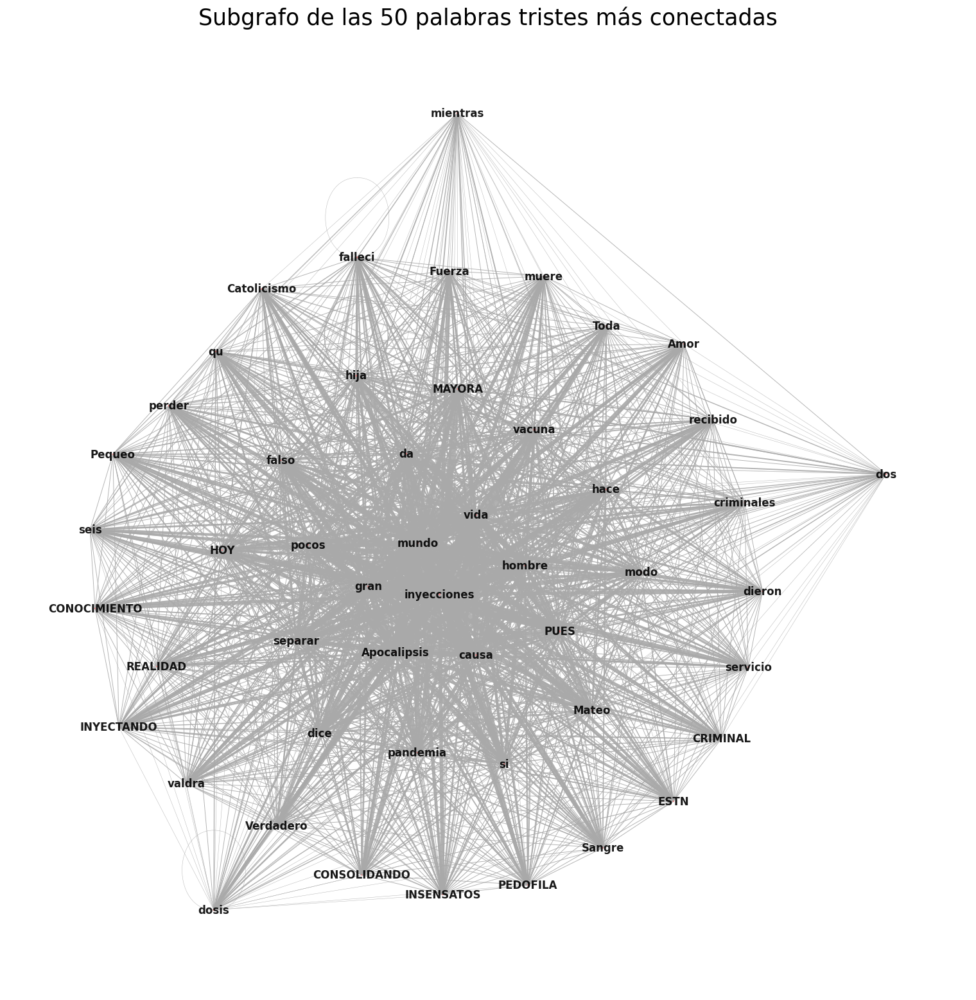

In [13]:
## Subgrafo de palabras tristes ##

# Encontrar los nodos con el mayor grado (más conexiones)
degrees = dict(G1.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G1.subgraph(top_words)

# Obtener el tamaño de los nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener los pesos de las aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]


# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights], # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras tristes más conectadas", fontsize=25)
plt.show()

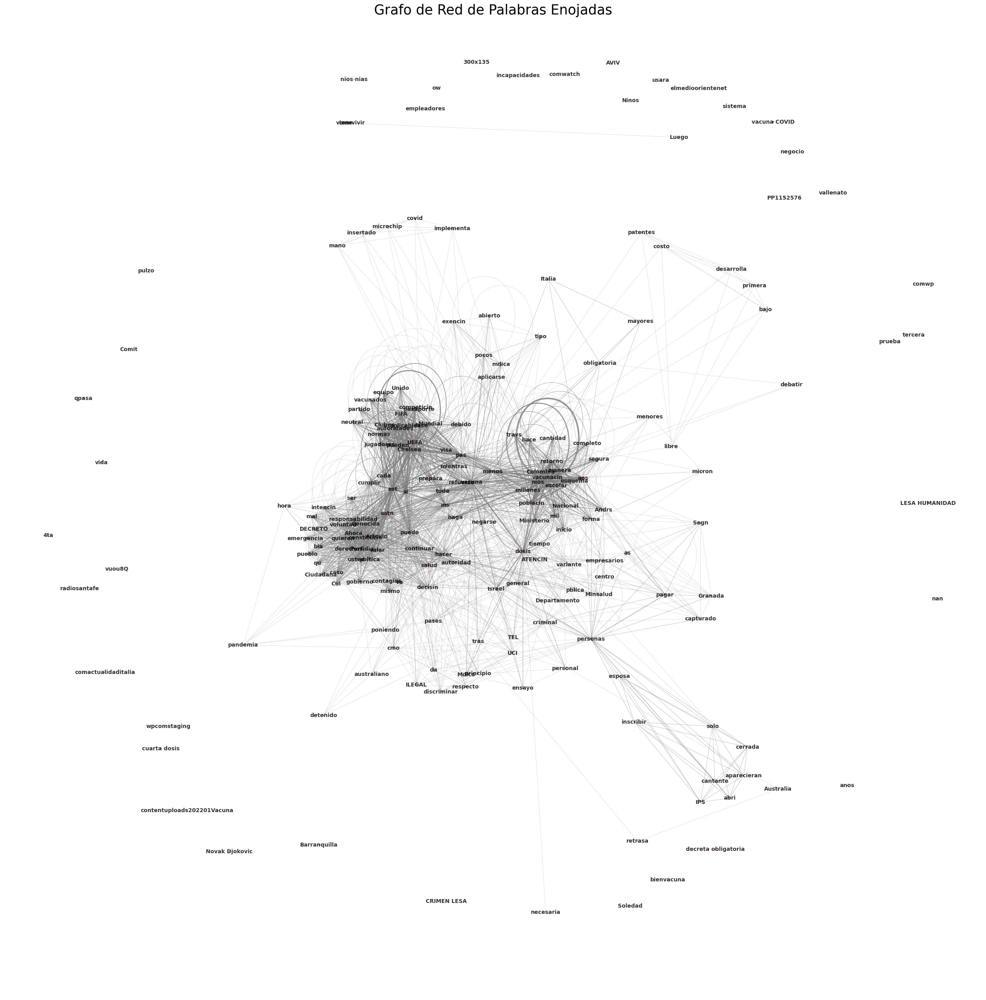

In [14]:
## Grafo de palabras enojadas ##

# Obtener las frecuencias de las palabras del objeto wordcloud
angry_word_frequencies = angry_wordcloud.words_

# Crear un grafo
G2 = nx.Graph()

# Añadir nodos con tamaño basado en la frecuencia
for word, freq in angry_word_frequencies.items():
    G2.add_node(word, size=freq)

# Iterar sobre cada mensaje para encontrar relaciones entre palabras
for message in angry_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre palabras que aparecen en el mismo mensaje
    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in angry_word_frequencies and word2 in angry_word_frequencies:
                 if G2.has_edge(word1, word2):
                     G2[word1][word2]['weight'] += 1
                 else:
                     G2.add_edge(word1, word2, weight=1)


# Obtener tamaños de nodos a partir del atributo 'size'
node_size = [G2.nodes[node]['size'] * 5 for node in G2.nodes()]  # Escalar tamaño de nodos para mejor visualización

# Obtener pesos de las aristas para la visualización (opcional, pero puede indicar fuerza de la relación)
edge_weights = [G2[u][v]['weight'] for u, v in G2.edges()]

# Dibujar el grafo
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G2, k=0.5, iterations=50)  # Usar layout spring para mejor visualización
nx.draw(G2, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey',  # Usar un color menos dominante para las aristas
        width=[w/5 for w in edge_weights],  # Reducir el grosor de las aristas
        alpha=0.8,  # Aumentar alpha para mejor visibilidad de los nodos
        font_size=10,  # Ajustar tamaño de fuente
        font_weight='bold'  # Hacer las etiquetas en negrita
       )
plt.title("Grafo de Red de Palabras Enojadas", fontsize=25)  # Aumentar tamaño de la fuente del título
plt.show()

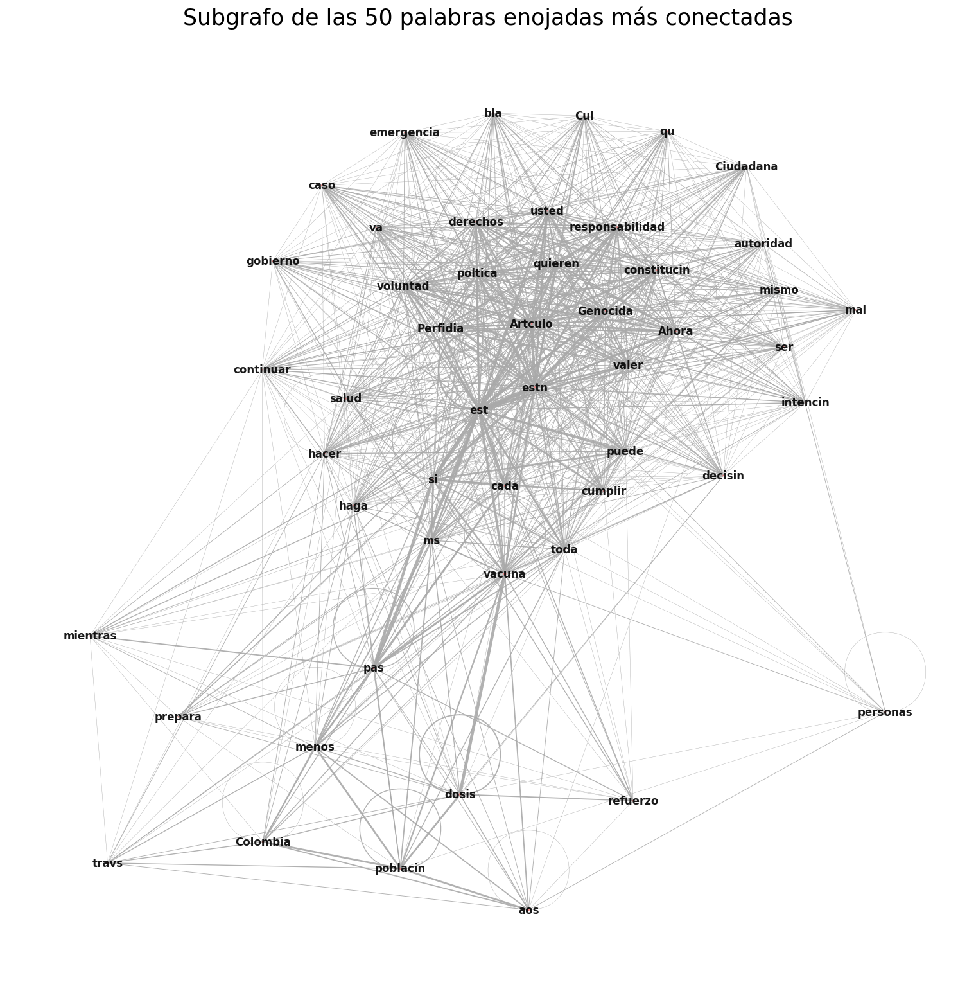

In [15]:
## Subgrafo de palabras enojadas ##

# Encontrar los nodos con el mayor grado (más conexiones)
degrees = dict(G2.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G2.subgraph(top_words)

# Obtener el tamaño de los nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener los pesos de las aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]


# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights],  # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras enojadas más conectadas", fontsize=25)
plt.show()









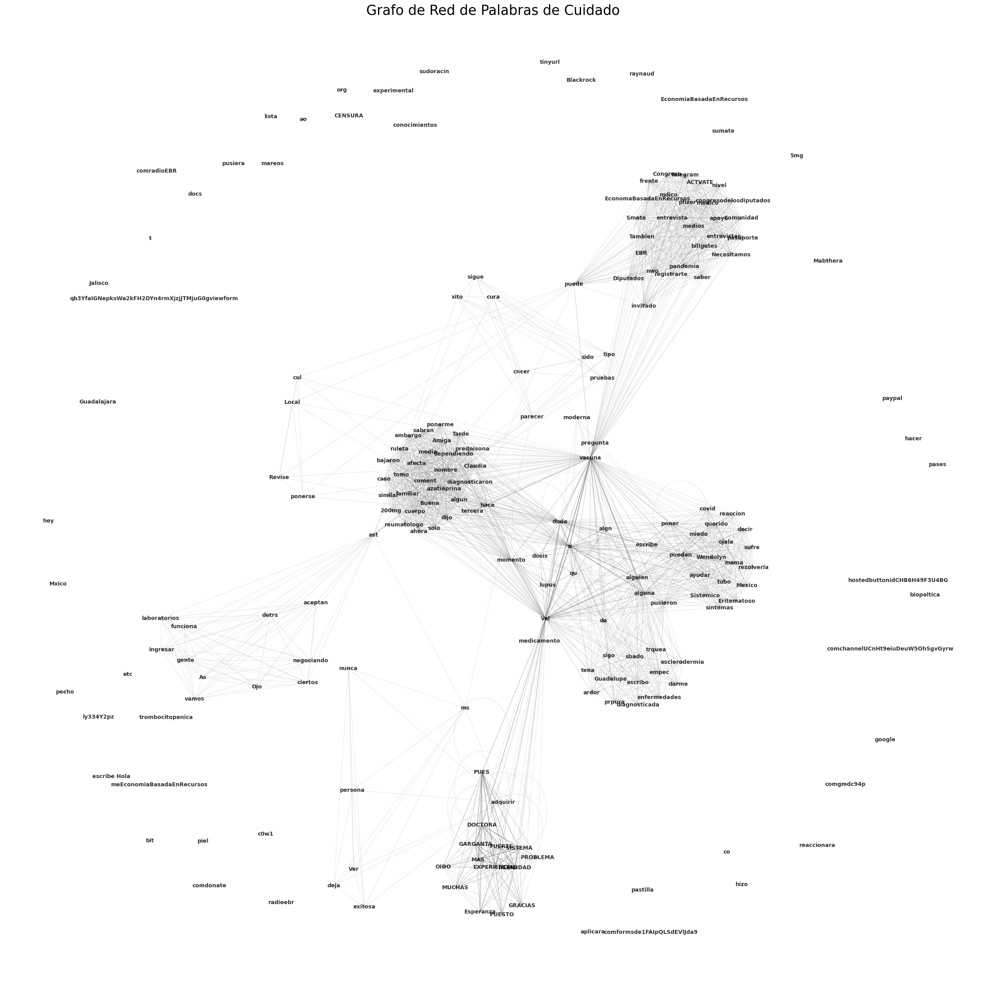

In [16]:
## Grafo de palabras de cuidado ##

# Obtener las frecuencias de las palabras del objeto wordcloud
care_word_frequencies = care_wordcloud.words_

# Crear un grafo
G3 = nx.Graph()

# Añadir nodos con tamaño basado en la frecuencia
for word, freq in care_word_frequencies.items():
    G3.add_node(word, size=freq)

# Iterar sobre cada mensaje para encontrar relaciones entre palabras
for message in care_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre palabras que aparecen en el mismo mensaje
    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in care_word_frequencies and word2 in care_word_frequencies:
                 if G3.has_edge(word1, word2):
                     G3[word1][word2]['weight'] += 1
                 else:
                     G3.add_edge(word1, word2, weight=1)


# Obtener tamaños de nodos a partir del atributo 'size'
node_size = [G3.nodes[node]['size'] * 5 for node in G3.nodes()]  # Escalar tamaño de nodos para mejor visualización

# Obtener pesos de las aristas para la visualización (opcional, pero puede indicar fuerza de la relación)
edge_weights = [G3[u][v]['weight'] for u, v in G3.edges()]

# Dibujar el grafo
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G3, k=0.5, iterations=50)  # Usar layout spring para mejor visualización
nx.draw(G3, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey',  # Usar un color menos dominante para las aristas
        width=[w/5 for w in edge_weights],  # Reducir el grosor de las aristas
        alpha=0.8,  # Aumentar alpha para mejor visibilidad de los nodos
        font_size=10,  # Ajustar tamaño de fuente
        font_weight='bold'  # Hacer las etiquetas en negrita
       )
plt.title("Grafo de Red de Palabras de Cuidado", fontsize=25)  # Aumentar tamaño de la fuente del título
plt.show()

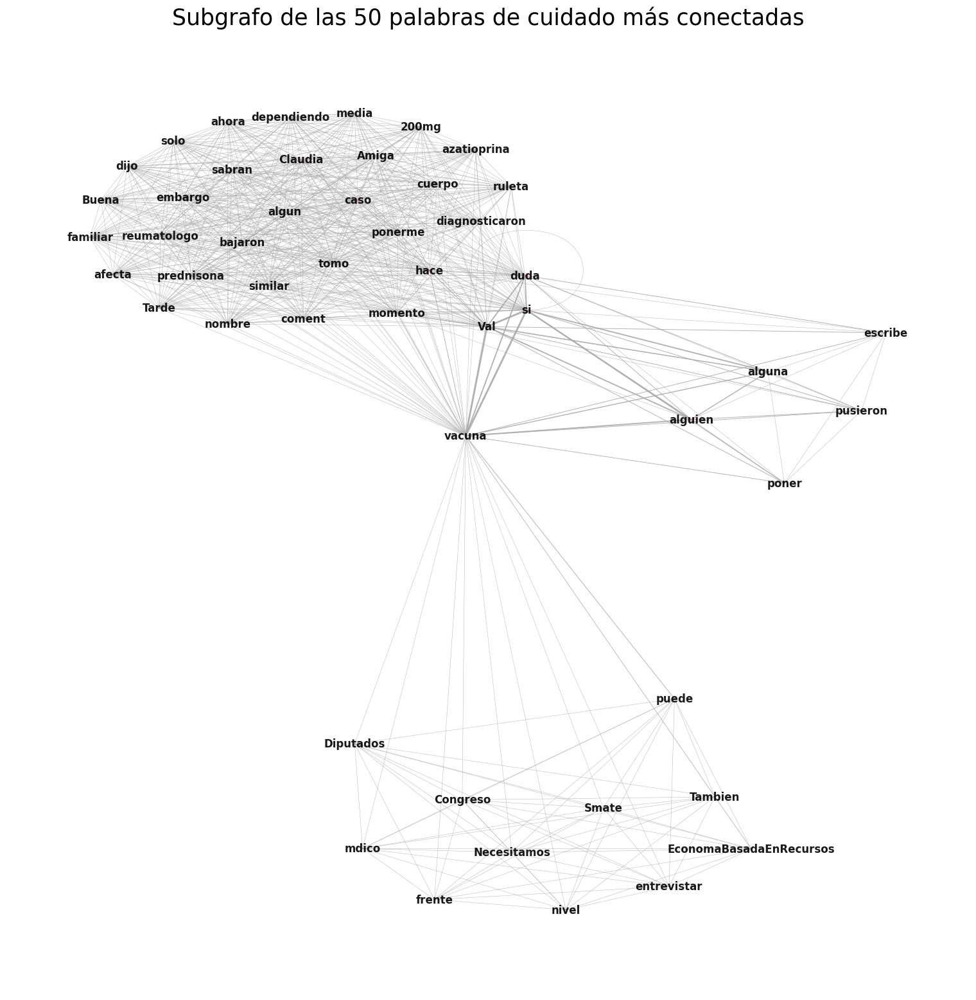

In [17]:
## Subgrafo de palabras de cuidado ##

# Encontrar los nodos con el mayor grado (más conexiones)
degrees = dict(G3.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G3.subgraph(top_words)

# Obtener el tamaño de los nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener los pesos de las aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]


# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights],  # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras de cuidado más conectadas", fontsize=25)
plt.show()









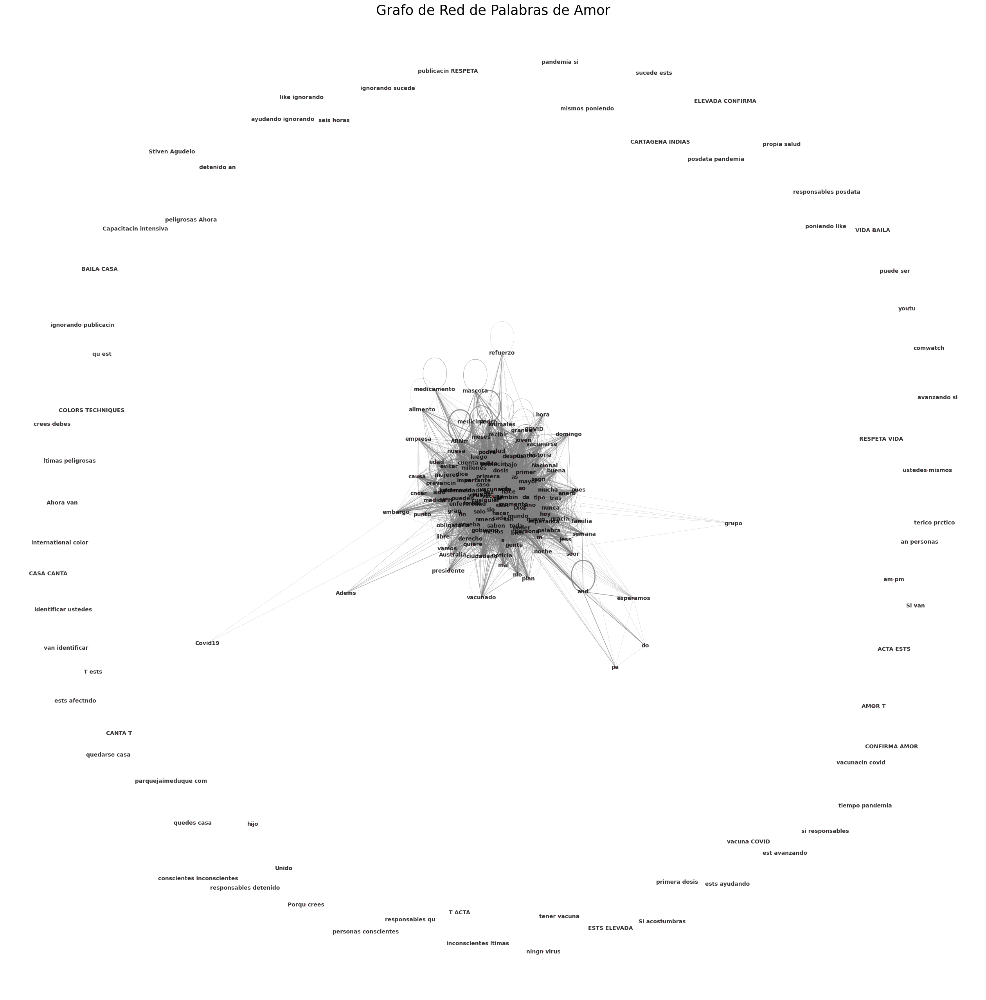

In [18]:
## Grafo de palabras de amor ##

# Obtener las frecuencias de las palabras del objeto wordcloud
love_word_frequencies = love_wordcloud.words_

# Crear un grafo
G = nx.Graph()

# Añadir nodos con tamaño basado en la frecuencia
for word, freq in love_word_frequencies.items():
    G.add_node(word, size=freq)

# Iterar sobre cada mensaje para encontrar relaciones entre palabras
for message in love_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre palabras que aparecen en el mismo mensaje
    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in love_word_frequencies and word2 in love_word_frequencies:
                 if G.has_edge(word1, word2):
                     G[word1][word2]['weight'] += 1
                 else:
                     G.add_edge(word1, word2, weight=1)


# Obtener tamaños de nodos a partir del atributo 'size'
node_size = [G.nodes[node]['size'] * 5 for node in G.nodes()]  # Escalar tamaño de nodos para mejor visualización

# Obtener pesos de las aristas para la visualización (opcional, pero puede indicar fuerza de la relación)
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Dibujar el grafo
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G, k=0.5, iterations=50)  # Usar layout spring para mejor visualización
nx.draw(G, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey',  # Usar un color menos dominante para las aristas
        width=[w/5 for w in edge_weights],  # Reducir el grosor de las aristas
        alpha=0.8,  # Aumentar alpha para mejor visibilidad de los nodos
        font_size=10,  # Ajustar tamaño de fuente
        font_weight='bold'  # Hacer las etiquetas en negrita
       )
plt.title("Grafo de Red de Palabras de Amor", fontsize=25)  # Aumentar tamaño de la fuente del título
plt.show()









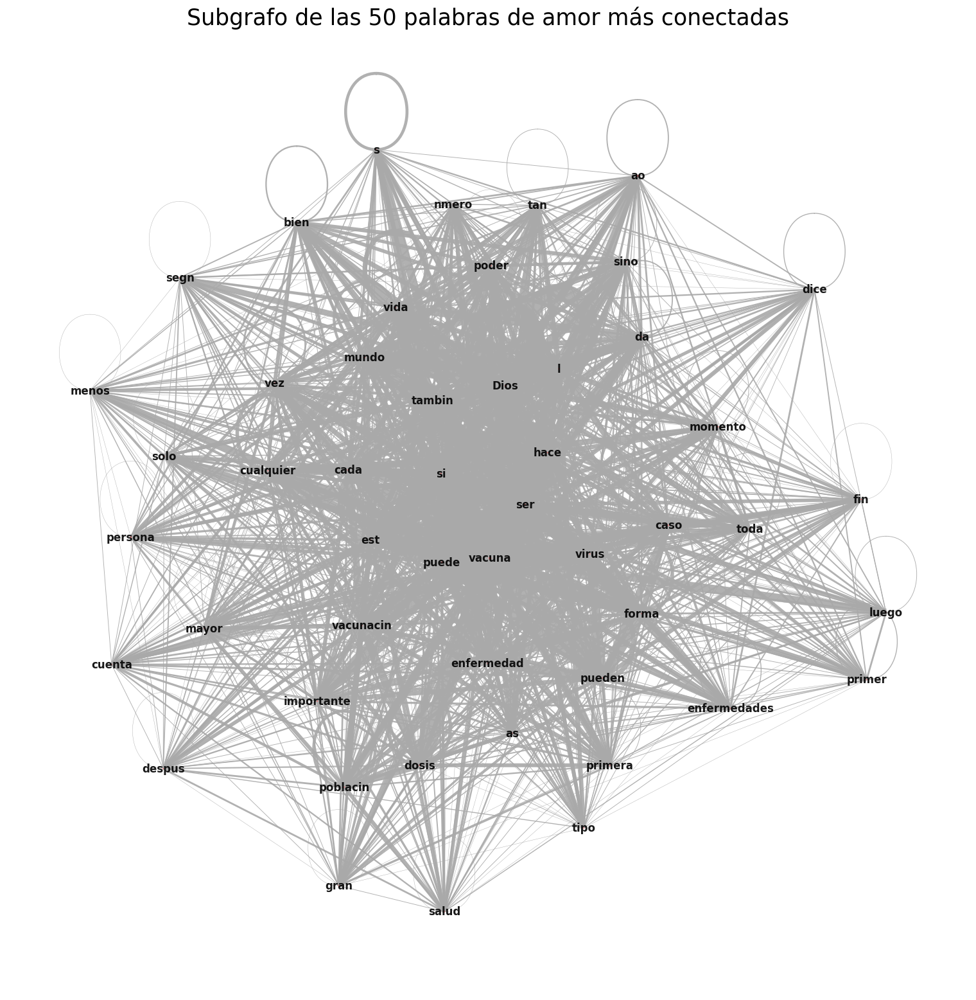

In [19]:
## Subgrafo de palabras de amor ##

# Encontrar los nodos con el mayor grado (más conexiones)
degrees = dict(G.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G.subgraph(top_words)

# Obtener el tamaño de los nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener los pesos de las aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]


# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights],  # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras de amor más conectadas", fontsize=25)
plt.show()









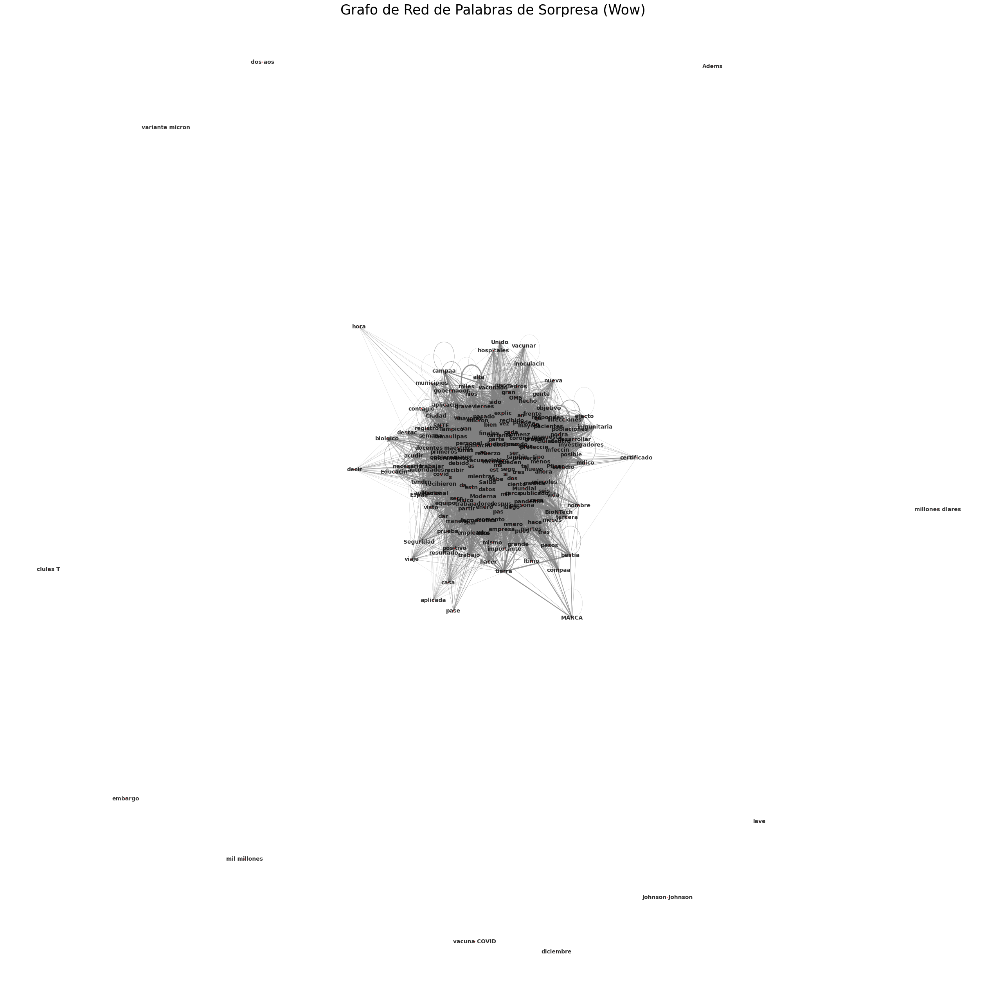

In [20]:
## Grafo de palabras de sorpresa (Wow) ##

# Obtener las frecuencias de las palabras del objeto wordcloud
wow_word_frequencies = wow_wordcloud.words_

# Crear un grafo
G4 = nx.Graph()

# Añadir nodos con tamaño basado en la frecuencia
for word, freq in wow_word_frequencies.items():
    G4.add_node(word, size=freq)

# Iterar sobre cada mensaje para encontrar relaciones entre palabras
for message in wow_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre palabras que aparecen en el mismo mensaje
    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in wow_word_frequencies and word2 in wow_word_frequencies:
                 if G4.has_edge(word1, word2):
                     G4[word1][word2]['weight'] += 1
                 else:
                     G4.add_edge(word1, word2, weight=1)


# Obtener tamaños de nodos a partir del atributo 'size'
node_size = [G4.nodes[node]['size'] * 5 for node in G4.nodes()]  # Escalar tamaño de nodos para mejor visualización

# Obtener pesos de las aristas para la visualización (opcional, pero puede indicar fuerza de la relación)
edge_weights = [G4[u][v]['weight'] for u, v in G4.edges()]

# Dibujar el grafo
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G4, k=0.5, iterations=50)  # Usar layout spring para mejor visualización
nx.draw(G4, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey',  # Usar un color menos dominante para las aristas
        width=[w/5 for w in edge_weights],  # Reducir el grosor de las aristas
        alpha=0.8,  # Aumentar alpha para mejor visibilidad de los nodos
        font_size=10,  # Ajustar tamaño de fuente
        font_weight='bold'  # Hacer las etiquetas en negrita
       )
plt.title("Grafo de Red de Palabras de Sorpresa (Wow)", fontsize=25)  # Aumentar tamaño de la fuente del título
plt.show()

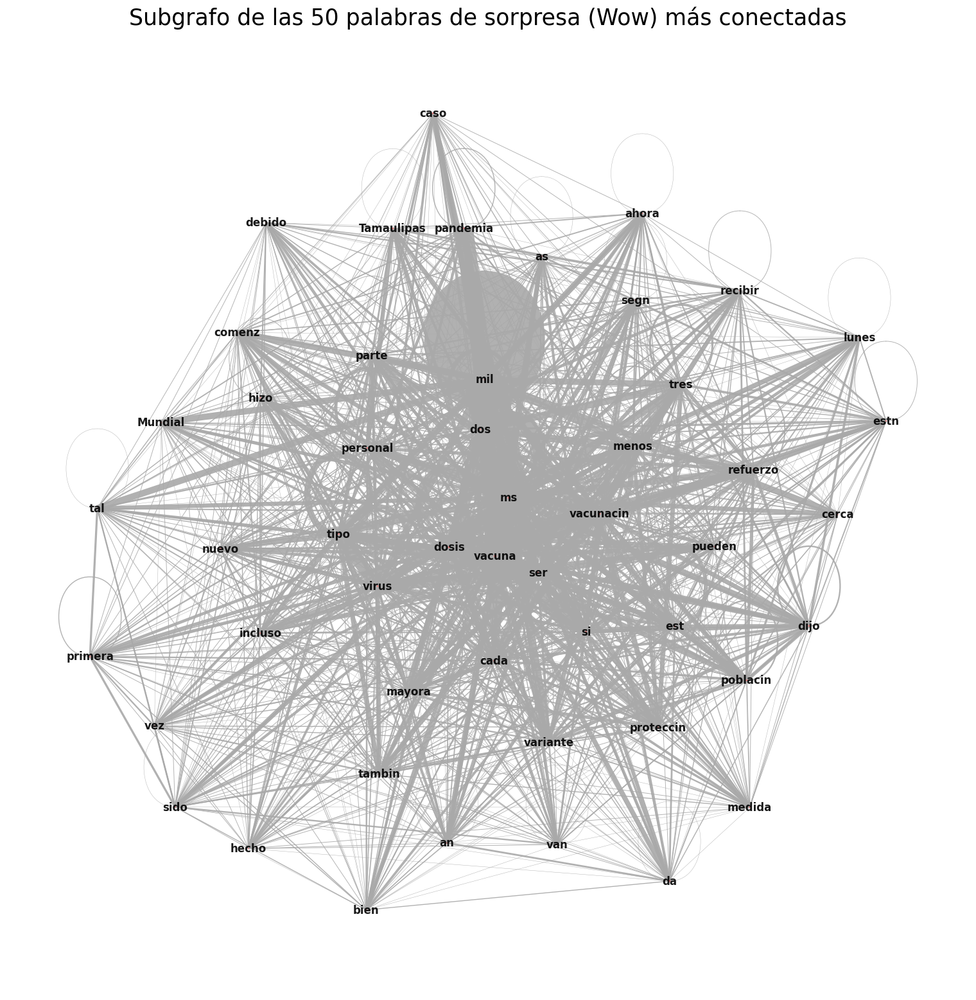

In [21]:
## Subgrafo de palabras de sorpresa (Wow) ##

# Encontrar los nodos con el mayor grado (más conexiones)
degrees = dict(G4.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G4.subgraph(top_words)

# Obtener el tamaño de los nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener los pesos de las aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]

# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights],  # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras de sorpresa (Wow) más conectadas", fontsize=25)
plt.show()

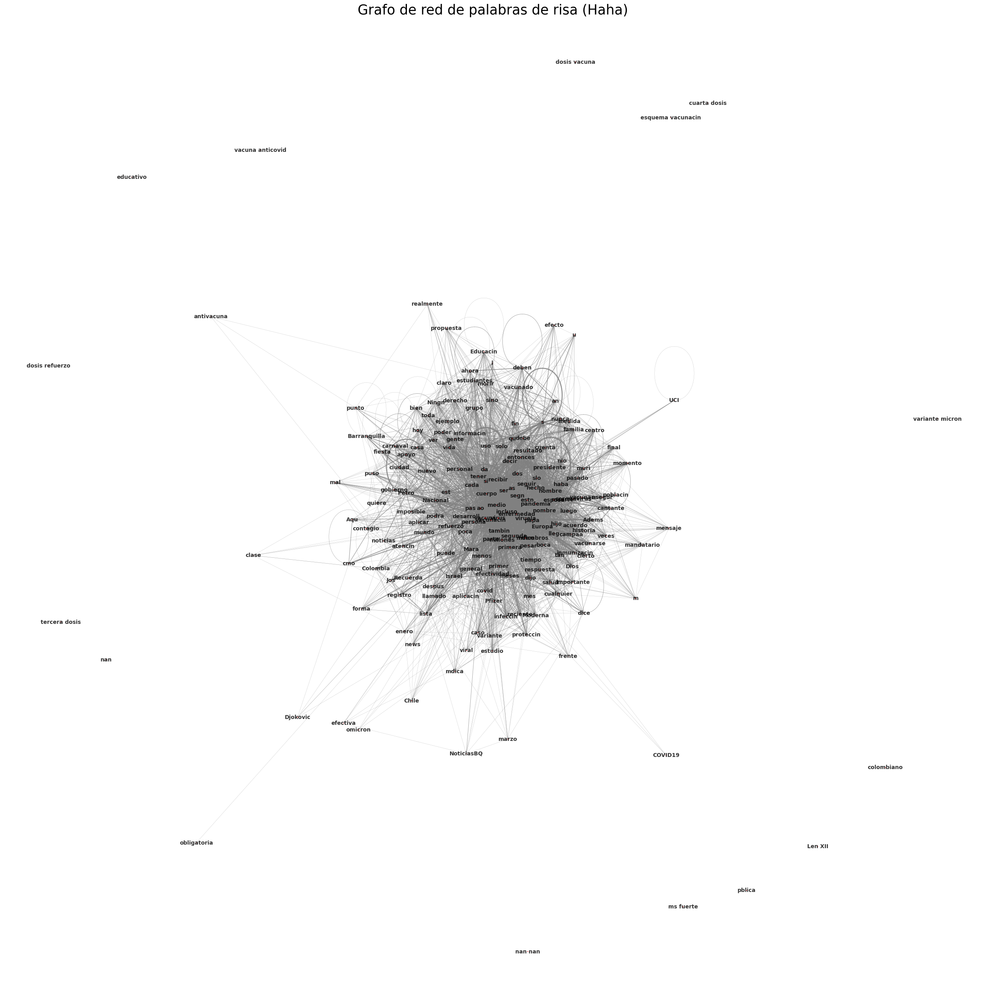

In [22]:
## Grafo de palabras de risa (Haha) ##

# Obtener las frecuencias de las palabras del objeto wordcloud
haha_word_frequencies = haha_wordcloud.words_

# Crear un grafo
G5 = nx.Graph()

# Añadir nodos con tamaño basado en la frecuencia
for word, freq in haha_word_frequencies.items():
    G5.add_node(word, size=freq)

# Iterar por cada mensaje para encontrar relaciones entre palabras
for message in haha_df['message'].dropna():
    words_in_message = message.split()
    # Crear aristas entre palabras que aparecen en el mismo mensaje
    for i in range(len(words_in_message)):
        for j in range(i + 1, len(words_in_message)):
            word1 = words_in_message[i]
            word2 = words_in_message[j]
            if word1 in haha_word_frequencies and word2 in haha_word_frequencies:
                 if G5.has_edge(word1, word2):
                     G5[word1][word2]['weight'] += 1
                 else:
                     G5.add_edge(word1, word2, weight=1)

# Obtener el tamaño de los nodos a partir del atributo 'size'
node_size = [G5.nodes[node]['size'] * 5 for node in G5.nodes()]  # Escalar tamaño de nodos para mejor visualización

# Obtener pesos de las aristas para la visualización (opcional, pero puede indicar la fuerza de la relación)
edge_weights = [G5[u][v]['weight'] for u, v in G5.edges()]

# Dibujar el grafo
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G5, k=0.5, iterations=50)  # Usar layout de resorte para mejor visualización
nx.draw(G5, pos,
        with_labels=True,
        node_size=node_size,
        node_color='red',
        edge_color='grey',  # Usar un color menos dominante para las aristas
        width=[w/5 for w in edge_weights],  # Reducir el grosor de las aristas
        alpha=0.8,  # Aumentar alfa para mejor visibilidad de nodos
        font_size=10,  # Ajustar tamaño de fuente
        font_weight='bold'  # Poner etiquetas en negrita
       )
plt.title("Grafo de red de palabras de risa (Haha)", fontsize=25)  # Aumentar tamaño de fuente del título
plt.show()









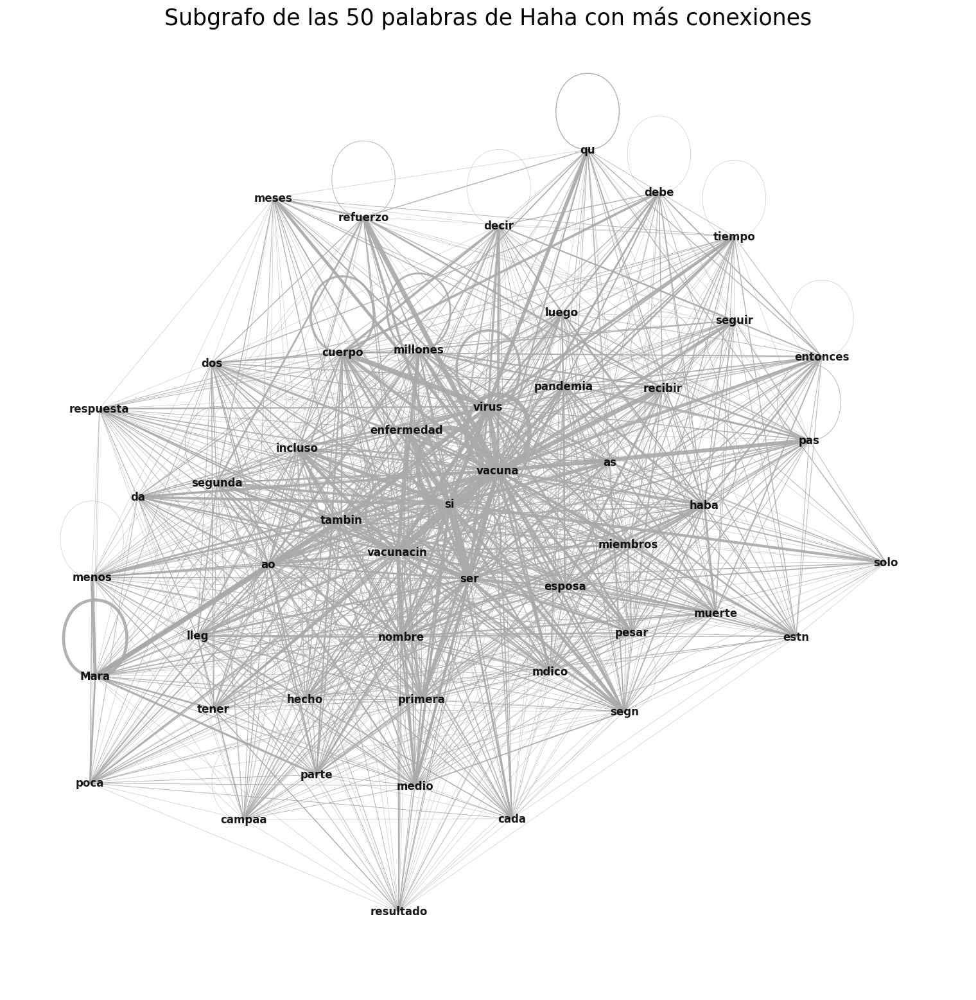

In [23]:
## Subgrafo de Haha ##

# Encontrar los nodos con mayor grado (más conexiones)
degrees = dict(G5.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Elegir las N palabras más conectadas
top_n = 50  # Puedes ajustar este número
top_words = [word for word, degree in sorted_degrees[:top_n]]

# Crear un subgrafo que contenga solo las N palabras principales y sus conexiones
subgraph = G5.subgraph(top_words)

# Obtener tamaños de nodos a partir del atributo 'size' para el subgrafo
subgraph_node_size = [subgraph.nodes[node]['size'] * 5 for node in subgraph.nodes()]

# Obtener pesos de aristas para el subgrafo
subgraph_edge_weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]

# Dibujar el subgrafo
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(subgraph, k=0.7, iterations=50)  # Ajustar el layout para el grafo más pequeño
nx.draw(subgraph, pos,
        with_labels=True,
        node_size=subgraph_node_size,
        node_color='lightcoral',  # Usar un color diferente para el subgrafo
        edge_color='darkgrey',
        width=[w/3 for w in subgraph_edge_weights],  # Reducir el grosor de las aristas para el subgrafo
        alpha=0.9,
        font_size=12,
        font_weight='bold'
       )
plt.title(f"Subgrafo de las {top_n} palabras de Haha con más conexiones", fontsize=25)
plt.show()

In [24]:
import pandas as pd #manipulación de datos

In [25]:
df=pd.read_csv('C:/Users/KEVIN/Downloads/emociones_texto (1).csv')

In [26]:
df

,Unnamed: 0,max_emotion,message,User name
0,0,Sad,La modelo brasileña Valentina Boscardin fallec...,rtamericalatina
1,1,Angry,Estos son los beneficiarios del atraco en los ...,cafepicantemorales
2,2,Love,Muchos expertos de la salud comentan que COVID...,FranklinGrahamES
3,3,Love,Algunos cristianos dudan sobre la vacuna del c...,PentecostalesAvivados
4,4,Love,Un destacado experto que ayudó a crear la vacu...,NaN
...,...,...,...,...
505,1014,Care,Esta es una de las vacunas más esperadas en el...,EmotionalContentMarketing
506,1017,Angry,"La IPS que estaba cerrada en Soledad, abrió so...",SombreroVCol
507,1019,Haha,Angustioso llamado de mujer antivacuna desde u...,Paisas
508,1030,Haha,"En Sudáfrica, los casos de COVID-19 han dismin...",democracynowes


In [27]:
import pandas as pd  # Libreria para manipular y visualizar datos
import re  # Extraer y limpiar cadenas de texto
import string  # Herramientas para trabajar con caracteres especiales y puntuación
import nltk  # Procesamiento de lenguaje natural
from nltk.corpus import stopwords  # Lista de palabras vacías
from nltk.stem import WordNetLemmatizer  #reducir palabras a su raíz

In [28]:
# Descargar recursos de NLTK (solo se ejecuta una vez)
nltk.download('stopwords')  # Descarga stopwords para inglés/español
nltk.download('wordnet')    # Descarga el léxico para lematización
nltk.download('omw-1.4')    # Soporte para múltiples idiomas

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...


True

In [31]:
df_sentimientos=pd.read_csv('C:/Users/KEVIN/Downloads/emociones_texto (1).csv').fillna('') #Para reemplazar valores nulos por espacios vacíos

In [32]:
df_sentimientos

,Unnamed: 0,max_emotion,message,User name
0,0,Sad,La modelo brasileña Valentina Boscardin fallec...,rtamericalatina
1,1,Angry,Estos son los beneficiarios del atraco en los ...,cafepicantemorales
2,2,Love,Muchos expertos de la salud comentan que COVID...,FranklinGrahamES
3,3,Love,Algunos cristianos dudan sobre la vacuna del c...,PentecostalesAvivados
4,4,Love,Un destacado experto que ayudó a crear la vacu...,
...,...,...,...,...
505,1014,Care,Esta es una de las vacunas más esperadas en el...,EmotionalContentMarketing
506,1017,Angry,"La IPS que estaba cerrada en Soledad, abrió so...",SombreroVCol
507,1019,Haha,Angustioso llamado de mujer antivacuna desde u...,Paisas
508,1030,Haha,"En Sudáfrica, los casos de COVID-19 han dismin...",democracynowes


In [33]:
df_emociones= df_sentimientos[['message',"max_emotion"]]

In [34]:
df_emociones

,message,max_emotion
0,La modelo brasileña Valentina Boscardin fallec...,Sad
1,Estos son los beneficiarios del atraco en los ...,Angry
2,Muchos expertos de la salud comentan que COVID...,Love
3,Algunos cristianos dudan sobre la vacuna del c...,Love
4,Un destacado experto que ayudó a crear la vacu...,Love
...,...,...
505,Esta es una de las vacunas más esperadas en el...,Care
506,"La IPS que estaba cerrada en Soledad, abrió so...",Angry
507,Angustioso llamado de mujer antivacuna desde u...,Haha
508,"En Sudáfrica, los casos de COVID-19 han dismin...",Haha


In [35]:
df_emociones["message"]=df_emociones["message"].astype(str) #Tranformación a cadenas de caracteres

C:\Users\KEVIN\AppData\Local\Temp\ipykernel_6172\1355393219.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_emociones["message"]=df_emociones["message"].astype(str) #Tranformación a cadenas de caracteres


In [36]:
import re

def limpiar_texto(texto):
    if isinstance(texto, str):
        # Reemplazar todas las entidades HTML, como &#009;, &#123;, etc.
        texto = re.sub(r'&#\d+;', ' ', texto)  # Reemplaza todas las secuencias de tipo &#xxx;

        # Eliminar secuencias de caracteres de control no visibles
        texto = re.sub(r'[\x00-\x1F\x7F]+', '', texto)  # Eliminar caracteres de control

        # Reemplazar '#####' u otras secuencias repetidas de # por un espacio vacío
        texto = re.sub(r'#+', '', texto)

        # Eliminar secuencias como \t, \n, \r (tabulaciones, saltos de línea, retorno de carro)
        texto = re.sub(r'[\t\n\r]+', ' ', texto)

        # Eliminar secuencias de espacios múltiples y dejar solo uno
        texto = re.sub(r'\s+', ' ', texto)

        # Eliminar espacios al principio y al final
        texto = texto.strip()

        # Eliminar secuencias que no fueron cubiertas
        texto = re.sub(r'&[a-zA-Z0-9]+;', ' ', texto)  # Cubre cualquier secuencia de &xxx;

    return texto

# Aplicar la función de limpieza a las columnas 'text' y 'comment'
df_emociones['message'] = df_emociones['message'].apply(limpiar_texto)


# Verificar las primeras filas después de la limpieza
(df_emociones[['message']].head())

C:\Users\KEVIN\AppData\Local\Temp\ipykernel_6172\3496264133.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_emociones['message'] = df_emociones['message'].apply(limpiar_texto)


,message
0,La modelo brasileña Valentina Boscardin fallec...
1,Estos son los beneficiarios del atraco en los ...
2,Muchos expertos de la salud comentan que COVID...
3,Algunos cristianos dudan sobre la vacuna del c...
4,Un destacado experto que ayudó a crear la vacu...


In [37]:
import re

def limpiar_texto(texto):
    if isinstance(texto, str):
        # Reemplazar todas las entidades HTML, como &#009;, &#123;, etc.
        texto = re.sub(r'&#\d+;', ' ', texto)  # Reemplaza todas las secuencias de tipo &#xxx;

        # Eliminar secuencias de caracteres de control no visibles
        texto = re.sub(r'[\x00-\x1F\x7F]+', '', texto)  # Eliminar caracteres de control

        # Reemplazar '#####' u otras secuencias repetidas de # por un espacio vacío
        texto = re.sub(r'#+', '', texto)

        # Eliminar secuencias como \t, \n, \r (tabulaciones, saltos de línea, retorno de carro)
        texto = re.sub(r'[\t\n\r]+', ' ', texto)

        # Eliminar secuencias de espacios múltiples y dejar solo uno
        texto = re.sub(r'\s+', ' ', texto)

        # Eliminar espacios al principio y al final
        texto = texto.strip()

        # Eliminar secuencias que no fueron cubiertas
        texto = re.sub(r'&[a-zA-Z0-9]+;', ' ', texto)  # Cubre cualquier secuencia de &xxx;

    return texto

# Aplicar la función de limpieza a las columnas 'text' y 'comment'
df_emociones['message'] = df_emociones['message'].apply(limpiar_texto)


# Verificar las primeras filas después de la limpieza
(df_emociones[['message']].head())

C:\Users\KEVIN\AppData\Local\Temp\ipykernel_6172\3496264133.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_emociones['message'] = df_emociones['message'].apply(limpiar_texto)


,message
0,La modelo brasileña Valentina Boscardin fallec...
1,Estos son los beneficiarios del atraco en los ...
2,Muchos expertos de la salud comentan que COVID...
3,Algunos cristianos dudan sobre la vacuna del c...
4,Un destacado experto que ayudó a crear la vacu...


In [38]:
# Función de limpieza (personalizada para español)
def clean_text_spanish(text):
    # Convertir a string por si hay valores no textuales (ej: NaN)
    text = str(text)

    # 1. Minúsculas y eliminar tildes
    text = text.lower()
    text = re.sub(r'[áäà]', 'a', text)
    text = re.sub(r'[éëè]', 'e', text)
    text = re.sub(r'[íïì]', 'i', text)
    text = re.sub(r'[óöò]', 'o', text)
    text = re.sub(r'[úüù]', 'u', text)
    text = re.sub(r'[ñ]', 'n', text)

    # 2. Eliminar URLs, menciones y hashtags
    text = re.sub(r'http\S+|www\S+|https\S+|\@\w+|\#\w+', '', text)

    # 3. Eliminar números y puntuación
    text = re.sub(r'\d+', '', text)
    text = text.translate(str.maketrans('', '', string.punctuation))

    # 4. Tokenización y eliminar stopwords
    stop_words_spanish = set(stopwords.words('spanish'))
    tokens = text.split()
    tokens = [word for word in tokens if word not in stop_words_spanish and len(word) > 2]

    # 5. Lematización (opcional, requiere ajustes para español)
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    return ' '.join(tokens)

In [39]:
df_emociones["columna_emociones"]=df_emociones["message"].apply(clean_text_spanish)

C:\Users\KEVIN\AppData\Local\Temp\ipykernel_6172\369342223.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_emociones["columna_emociones"]=df_emociones["message"].apply(clean_text_spanish)


In [40]:
df_emociones

,message,max_emotion,columna_emociones
0,La modelo brasileña Valentina Boscardin fallec...,Sad,modelo brasilena valentina boscardin fallecio ...
1,Estos son los beneficiarios del atraco en los ...,Angry,beneficiarios atraco peajes entregado amigo ce...
2,Muchos expertos de la salud comentan que COVID...,Love,expertos salud comentan covid desaparecera ten...
3,Algunos cristianos dudan sobre la vacuna del c...,Love,cristianos dudan vacuna covid mitos formado al...
4,Un destacado experto que ayudó a crear la vacu...,Love,destacado experto ayudo crear vacuna covid oxf...
...,...,...,...
505,Esta es una de las vacunas más esperadas en el...,Care,vacunas ma esperadas mundo parecer funcionando...
506,"La IPS que estaba cerrada en Soledad, abrió so...",Angry,ip cerrada soledad abrio solo inscribir cantan...
507,Angustioso llamado de mujer antivacuna desde u...,Haha,angustioso llamado mujer antivacuna uci “estoy...
508,"En Sudáfrica, los casos de COVID-19 han dismin...",Haha,sudafrica casos covid disminuido semana despue...


In [41]:
!pip install emoji --quiet


In [42]:
import emoji

def quitar_emojis(texto):
    if isinstance(texto, str):
        return emoji.replace_emoji(texto, replace='')
    return texto

# Aplicamos a todas las columnas de texto
df_emociones = df_emociones.applymap(quitar_emojis)

C:\Users\KEVIN\AppData\Local\Temp\ipykernel_6172\2851110618.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_emociones = df_emociones.applymap(quitar_emojis)


In [50]:
import pandas as pd

In [51]:
df=pd.read_excel("/Users/KEVIN/Documents/campamento/emociones_procesadas.xlsx")

In [52]:
df

,message,max_emotion,columna_emociones
0,La modelo brasileña Valentina Boscardin fallec...,Sad,modelo brasilena valentina boscardin fallecio ...
1,Estos son los beneficiarios del atraco en los ...,Angry,beneficiarios atraco peajes entregado amigo ce...
2,Muchos expertos de la salud comentan que COVID...,Love,expertos salud comentan covid desaparecera ten...
3,Algunos cristianos dudan sobre la vacuna del c...,Love,cristianos dudan vacuna covid mitos formado al...
4,Un destacado experto que ayudó a crear la vacu...,Love,destacado experto ayudo crear vacuna covid oxf...
...,...,...,...
505,Esta es una de las vacunas más esperadas en el...,Care,vacunas ma esperadas mundo parecer funcionando...
506,"La IPS que estaba cerrada en Soledad, abrió so...",Angry,ip cerrada soledad abrio solo inscribir cantan...
507,Angustioso llamado de mujer antivacuna desde u...,Haha,angustioso llamado mujer antivacuna uci “estoy...
508,"En Sudáfrica, los casos de COVID-19 han dismin...",Haha,sudafrica casos covid disminuido semana despue...


In [53]:
df=pd.read_excel("/Users/KEVIN/Documents/campamento/emociones_procesadas.xlsx").fillna('')

In [54]:
df

,message,max_emotion,columna_emociones
0,La modelo brasileña Valentina Boscardin fallec...,Sad,modelo brasilena valentina boscardin fallecio ...
1,Estos son los beneficiarios del atraco en los ...,Angry,beneficiarios atraco peajes entregado amigo ce...
2,Muchos expertos de la salud comentan que COVID...,Love,expertos salud comentan covid desaparecera ten...
3,Algunos cristianos dudan sobre la vacuna del c...,Love,cristianos dudan vacuna covid mitos formado al...
4,Un destacado experto que ayudó a crear la vacu...,Love,destacado experto ayudo crear vacuna covid oxf...
...,...,...,...
505,Esta es una de las vacunas más esperadas en el...,Care,vacunas ma esperadas mundo parecer funcionando...
506,"La IPS que estaba cerrada en Soledad, abrió so...",Angry,ip cerrada soledad abrio solo inscribir cantan...
507,Angustioso llamado de mujer antivacuna desde u...,Haha,angustioso llamado mujer antivacuna uci “estoy...
508,"En Sudáfrica, los casos de COVID-19 han dismin...",Haha,sudafrica casos covid disminuido semana despue...


In [55]:
!pip install bertopic


In [56]:
import nltk
from nltk.corpus import stopwords

# Descargar la lista de palabras vacías (stopwords) en español si aún no se ha descargado
nltk.download('stopwords')

# Definir la lista de palabras vacías en español
spanish_stop_words = stopwords.words('spanish')

# Importar la clase CountVectorizer para vectorizar texto, ignorando las stopwords definidas
from sklearn.feature_extraction.text import CountVectorizer

# Importar el modelo para obtener embeddings de frases
from sentence_transformers import SentenceTransformer

# Importar UMAP para reducción de dimensionalidad
from umap import UMAP

# Importar BERTopic para modelado de temas
from bertopic import BERTopic

# Crear un vectorizador que elimina las stopwords en español, 
# considera solo palabras que aparezcan en al menos 2 documentos (min_df=2)
# y extrae unigramas y bigramas (ngram_range=(1, 2))
vectorizer_model = CountVectorizer(stop_words=spanish_stop_words, min_df=2, ngram_range=(1, 2))

# --- El resto de tu código ---

# Cargar un modelo multilingüe para generar embeddings de las oraciones en español
spanish_model = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# Configurar UMAP para reducción de dimensionalidad con parámetros específicos
# n_neighbors: número de vecinos para definir el espacio local
# n_components: número de dimensiones resultantes
# min_dist: distancia mínima entre puntos en el espacio reducido
# metric: métrica usada para calcular distancias (aquí 'cosine')
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')

# Crear el modelo BERTopic usando el modelo de embeddings, UMAP para reducción
# y el vectorizador definido. También se establece un tamaño mínimo para los temas
# y se activa la salida de información detallada con verbose=True.
topic_model = BERTopic(
    embedding_model=spanish_model,
    umap_model=umap_model,
    vectorizer_model=vectorizer_model,
    min_topic_size=40,
    verbose=True
)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [57]:
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer
from umap import UMAP
from bertopic import BERTopic

# Descargar la lista de palabras vacías (stopwords) en español si aún no la tienes
nltk.download('stopwords')

# Cargar las stopwords en español para eliminar palabras muy comunes que no aportan información
spanish_stop_words = stopwords.words('spanish')

# Crear un vectorizador de texto que:
# - elimina las stopwords definidas arriba
# - ignora palabras que aparecen en menos de 2 documentos (min_df=2)
# - extrae unigramas y bigramas (ngram_range=(1, 2)) para capturar palabras individuales y pares de palabras
vectorizer_model = CountVectorizer(stop_words=spanish_stop_words, min_df=2, ngram_range=(1, 2))

# Cargar un modelo preentrenado para obtener representaciones numéricas (embeddings) de las oraciones en varios idiomas, incluyendo español
spanish_model = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# --- AJUSTES CLAVE ---
# Configurar UMAP para reducir la dimensionalidad de los embeddings:
# - n_neighbors=10: tamaño del vecindario para preservar la estructura local
# - n_components=10: dimensiones resultantes tras la reducción (más dimensiones capturan más información)
# - min_dist=0.0: permite que puntos similares estén muy cerca en el espacio reducido
# - metric='cosine': métrica de distancia usada para calcular similitud
# - random_state=42: para obtener resultados reproducibles
umap_model = UMAP(n_neighbors=10, n_components=10, min_dist=0.0, metric='cosine', random_state=42)

# Crear el modelo BERTopic usando:
# - el modelo de embeddings para representar textos
# - UMAP para reducción de dimensiones
# - el vectorizador para transformar texto en matrices numéricas
# - min_topic_size=6 para permitir temas pequeños (mínimo 6 documentos por tema)
# - nr_topics=7 para forzar que se generen exactamente 7 temas
# - verbose=True para mostrar detalles durante el entrenamiento
topic_model = BERTopic(
    embedding_model=spanish_model,
    umap_model=umap_model,
    vectorizer_model=vectorizer_model,
    min_topic_size=6,
    nr_topics=7,
    verbose=True
)

# Suponiendo que tienes un DataFrame 'df' con una columna 'message' que contiene los textos a analizar
# Convierte la columna 'message' a lista de strings para pasarla al modelo
documents = df['message'].astype(str).tolist()

# Entrenar el modelo BERTopic con los documentos y obtener:
# - topics: lista con el tema asignado a cada documento
# - probs: lista con la probabilidad/confianza de cada asignación de tema
topics, probs = topic_model.fit_transform(documents)

# Imprimir la cantidad de temas encontrados (debería ser 7, según nr_topics)
print(f"Número de temas encontrados: {len(topic_model.get_topics())}")

# Mostrar los temas encontrados, excepto el tema -1 que agrupa documentos atípicos (outliers)
for topic_id in topic_model.get_topics():
    if topic_id != -1:
        print(f"Tema {topic_id}: {topic_model.get_topic(topic_id)}")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KEVIN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Batches:   0%|          | 0/16 [00:00<?, ?it/s]

2025-06-05 21:44:05,874 - BERTopic - Transformed documents to Embeddings
2025-06-05 21:44:13,784 - BERTopic - Reduced dimensionality
2025-06-05 21:44:13,814 - BERTopic - Clustered reduced embeddings
2025-06-05 21:44:14,073 - BERTopic - Reduced number of topics from 19 to 7


Número de temas encontrados: 7
Tema 0: [('vacuna', np.float64(0.05566850808391266)), ('covid', np.float64(0.044021771593662155)), ('dosis', np.float64(0.040056466381479465)), ('19', np.float64(0.03505056699133041)), ('covid 19', np.float64(0.0349718826694058)), ('vacunas', np.float64(0.03158861354330783)), ('vacunación', np.float64(0.028687618421983644)), ('años', np.float64(0.020935261971385472)), ('si', np.float64(0.020910275937339053)), ('millones', np.float64(0.020451642139309188))]
Tema 1: [('vacuna así', np.float64(0.37813406233609426)), ('evolución', np.float64(0.37813406233609426)), ('efectividad vacuna', np.float64(0.35787379225734)), ('significa', np.float64(0.3435026705899063)), ('señores', np.float64(0.3435026705899063)), ('serio', np.float64(0.33235847160960286)), ('última', np.float64(0.31556080684710586)), ('mas', np.float64(0.31556080684710586)), ('efectividad', np.float64(0.30889720570253004)), ('hora', np.float64(0.29301340443696244))]
Tema 2: [('youtube', np.float64(

In [58]:
# Generar y mostrar  el gráfico de barras de los temas
# Asegúrarse de que topic_model esté entrenado (fit_transform ya se ejecutó)
fig_barras = topic_model.visualize_barchart(top_n_topics=50) # Puedes ajustar top_n_topics

# Mostrar  la figura 
fig_barras.show() #  añadir línea para forzar la visualización

In [60]:
# --- Importación de librerías necesarias ---
import plotly.express as px  # Para visualización interactiva de gráficos
import pandas as pd          # Para manipulación de datos estructurados
import numpy as np           # Para tipos numéricos precisos como np.float64

# --- Definición de los datos de entrada ---
# Lista de temas, donde cada tema es un diccionario con:
# - 'id': identificador numérico del tema
# - 'palabras': lista de tuplas (palabra, score de importancia) representadas como np.float64
temas_data = [
    {
        'id': 0,
        'palabras': [('vacuna', np.float64(0.0556)), ('covid', np.float64(0.0440)), ('dosis', np.float64(0.0400)), 
                     ('19', np.float64(0.0350)), ('covid 19', np.float64(0.0349))]
    },
    {
        'id': 1,
        'palabras': [('vacuna así', np.float64(0.3781)), ('evolución', np.float64(0.3781)), 
                     ('efectividad vacuna', np.float64(0.3578)), ('significa', np.float64(0.3435))]
    },
    {
        'id': 2,
        'palabras': [('youtube', np.float64(0.0693)), ('https', np.float64(0.0646)), 
                     ('com', np.float64(0.0554)), ('https www', np.float64(0.0468))]
    },
    {
        'id': 3,
        'palabras': [('djokovic', np.float64(0.2956)), ('australia', np.float64(0.1504)), 
                     ('deportes', np.float64(0.0882)), ('tenis', np.float64(0.0769))]
    },
    {
        'id': 4,
        'palabras': [('https', np.float64(0.1165)), ('https youtu', np.float64(0.0850)), 
                     ('youtu', np.float64(0.0845)), ('youtu be', np.float64(0.0845))]
    },
    {
        'id': 5,
        'palabras': [('dios', np.float64(0.1258)), ('señor', np.float64(0.0547)), 
                     ('ser', np.float64(0.0536)), ('palabra', np.float64(0.0458))]
    }
]

# --- Definición de función para graficar las palabras clave de un tema ---
def generar_grafico_tema(tema_id, palabras_score, num_palabras=5):
    """
    Genera un gráfico de barras horizontal que muestra las palabras clave más importantes
    asociadas a un tema específico según su score de importancia.

    Parámetros:
    - tema_id (int): ID del tema a visualizar
    - palabras_score (list): Lista de tuplas (palabra, score)
    - num_palabras (int): Número de palabras clave a mostrar
    """
    
    # Ordenar las palabras por importancia (de mayor a menor)
    palabras_score_ordenadas = sorted(palabras_score, key=lambda x: x[1], reverse=True)

    # Seleccionar solo las N palabras más relevantes
    top_n_palabras = palabras_score_ordenadas[:num_palabras]

    # Separar texto y score en listas independientes para graficar
    palabras_solo_texto = [item[0] for item in top_n_palabras]
    importancia_scores = [item[1] for item in top_n_palabras]

    # Crear un DataFrame para alimentar al gráfico
    df_tema = pd.DataFrame({
        'Palabra': palabras_solo_texto,
        'Importancia': importancia_scores
    })

    # Ordenar el DataFrame para que el gráfico muestre la palabra más importante arriba
    df_tema = df_tema.sort_values(by='Importancia', ascending=True)

    # Crear el gráfico de barras horizontal
    fig = px.bar(
        df_tema,
        x='Importancia',
        y='Palabra',
        orientation='h',
        title=f'Palabras clave para el Tema {tema_id}',
        color='Palabra',
        color_discrete_sequence=px.colors.qualitative.Plotly
    )

    # Ajustes de presentación del gráfico
    fig.update_layout(
        xaxis_title='Importancia',
        yaxis_title='Palabra',
        showlegend=False,
        title_font_size=20,
        xaxis_range=[0, max(df_tema['Importancia']) * 1.1]  # Expande un poco el eje X
    )

    # Mostrar el gráfico en el navegador o entorno interactivo
    fig.show()

# --- Generación de gráficos para todos los temas en la lista ---
print(f"Número de temas encontrados: {len(temas_data)}")

# Iterar por cada tema y generar su gráfico correspondiente
for tema in temas_data:
    generar_grafico_tema(tema['id'], tema['palabras'], num_palabras=5)

Número de temas encontrados: 6
